In [35]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
from IPython.display import Image, clear_output  # to display images
display = utils.notebook_init()  # checks

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

YOLOv5 🚀 v6.1-54-ga2d617e torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 40.4/78.2 GB disk)
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [36]:
%cd /content/yolov5
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="9u8eLhhbftnfbyLtXg8t")
project = rf.workspace("3d-model-product").project("3d_all")
dataset = project.version(3).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to 3d_all-3 in yolov5pytorch:: 100%|██████████| 711/711 [00:00<00:00, 904.11it/s] 


In [37]:
!pip install wandb
!wandb login

wandb: Currently logged in as: jf-raisa (use `wandb login --relogin` to force relogin)


In [38]:
import wandb
wandb.init(project="3D object detection-img number exp per class 25")

In [39]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml
#%cat /content/yolov5/3d_all-1/data.yaml

names:
- pa1
- pa2
- pa3
- pb1
- pb2
- pb3
- pc1
- pc2
- pc3
nc: 9
train: 3d_all-3/train/images
val: 3d_all-3/valid/images


In [40]:
!nvidia-smi

Tue Mar 22 08:09:58 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P8    35W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [41]:
!python train.py --img 640 --batch 32 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

wandb: Currently logged in as: jf-raisa (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/3d_all-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-54-ga2d617e torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, i

In [42]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [43]:
%cd /content/yolov5/

/content/yolov5


In [44]:
!python detect.py --weights runs/train/exp4/weights/best.pt --img 640 --conf 0.1 --source /content/drive/MyDrive/eval_dataset

detect: weights=['runs/train/exp4/weights/best.pt'], source=/content/drive/MyDrive/eval_dataset, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-54-ga2d617e torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7034398 parameters, 0 gradients, 15.9 GFLOPs
image 1/95 /content/drive/.shortcut-targets-by-id/1uDsM_Iv3ovPUsutC40pOS_QtnFSHgyhn/eval_dataset/combine_pro (1).png: 640x640 1 pb1, 3 pb2s, Done. (0.034s)
image 2/95 /content/drive/.shortcut-targets-by-id/1uDsM_Iv3ovPUsutC40pOS_QtnFSHgyhn/eval_dataset/combine_pro (10).png: 640x640 3 pb1s, Done. (0.034s)
image 3/95 /content/drive/.shortcut-targets-by-id/1u

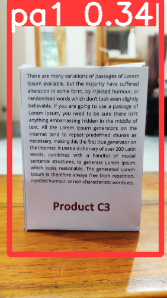

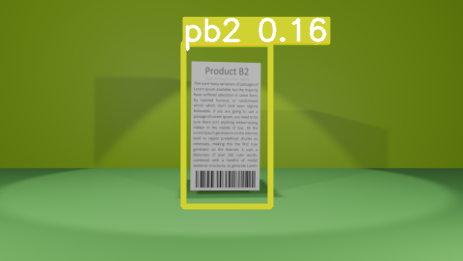

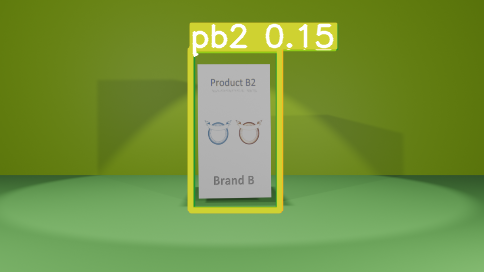

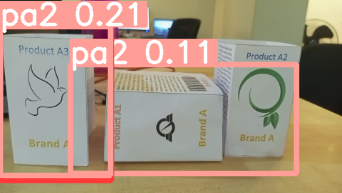

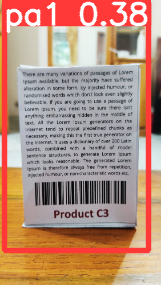

...

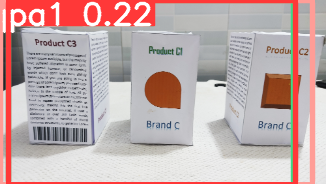

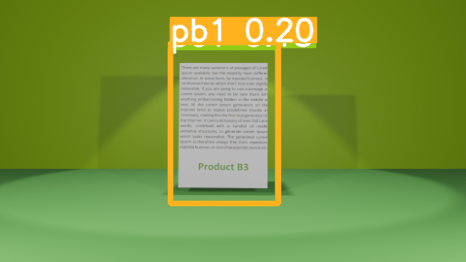

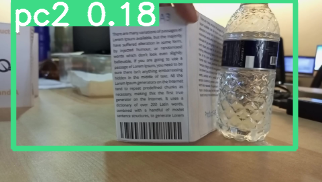

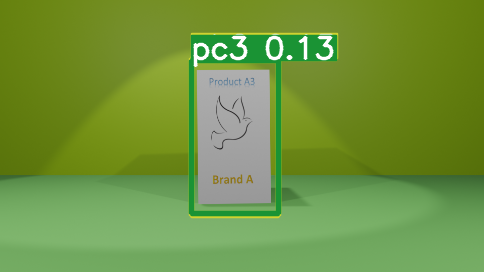

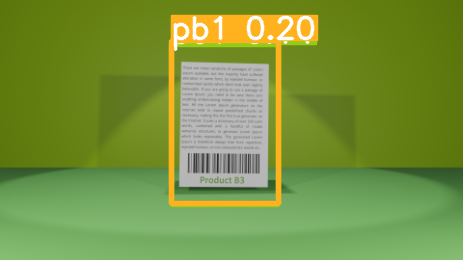

In [45]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [27]:
#!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

In [28]:
#display inference on ALL test images

#import glob
#from IPython.display import Image, display

#for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
 #   display(Image(filename=imageName))
  #  print("\n")

In [46]:
!python export.py --weights /content/yolov5/runs/train/exp4/weights/best.pt --include tfjs

export: data=data/coco128.yaml, weights=['/content/yolov5/runs/train/exp4/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tfjs']
YOLOv5 🚀 v6.1-54-ga2d617e torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7034398 parameters, 0 gradients, 15.9 GFLOPs

PyTorch: starting from /content/yolov5/runs/train/exp4/weights/best.pt with output shape (1, 25200, 14) (13.8 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.0...

                 from  n    params  module                                  arguments                     
2022-03-22 09:19:36.992434: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1

In [47]:
!zip -r /content/best_web_model.zip /content/yolov5/runs/train/exp4/weights/best_web_model

  adding: content/yolov5/runs/train/exp4/weights/best_web_model/ (stored 0%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard5of7.bin (deflated 7%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard7of7.bin (deflated 8%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/model.json (deflated 94%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard2of7.bin (deflated 7%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard4of7.bin (deflated 7%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard3of7.bin (deflated 7%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard1of7.bin (deflated 8%)
  adding: content/yolov5/runs/train/exp4/weights/best_web_model/group1-shard6of7.bin (deflated 7%)
